# Impulse response

Impulse response $h[n]$ for the input $\delta[n]$.

In [1]:
import plotly.express as px
import numpy as np
from sistema_desconhecido import sistema_desconhecido

n=np.arange(799)
xn=np.zeros(400)

xn[0]=1;


yn=sistema_desconhecido(xn)

fig = px.scatter(x=n, y=yn)
fig.show()


# Cossine response

The following code is going to show the cossine response. The frequency is controlled by the slider bar.

In [4]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from sistema_desconhecido import sistema_desconhecido

In [5]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [6]:
n  = np.arange(1000)

In [7]:
def cos_response(w):
    xn=np.cos(w*n);
    yn=sistema_desconhecido(xn)

    plt.plot(yn)
    plt.plot(xn)
interact(cos_response, w=(0,np.pi,0.001*np.pi))

interactive(children=(FloatSlider(value=1.567654734141307, description='w', max=3.141592653589793, step=0.0031…

<function __main__.cos_response(w)>

# Frequency response

In this section we will acquire the frequency response by exciting the system with a cosine input (eigen function of linear systems).

## Create input sequences

First we will generate the inputs for the system and dispose them into a matrix, each row will be the cosine input for a specific frequency

In [51]:
# Number of input samples
N = 1000;

# Frequency quantization
freq_quantization = 1000;

# User warning about what will be generated
print("I am going to generate", freq_quantization, "inputs sequences of size", N, " spaced by", np.pi/freq_quantization, "rad")

#X = np.zeros((freq_quantization, N))

X = {}

X['samples'] = np.arange(N)
X['freq1'] = np.cos(0.01*np.arange(N))

#for i in range(freq_quantization):
#    X[i] = np.cos(n)
#    plt.plot(X[i])
    
df=pd.DataFrame(X) 
print(df)

fig = px.line(df,x='samples',y='freq1')
fig.show()


I am going to generate 1000 inputs sequences of size 1000  spaced by 0.0031415926535897933 rad
     samples     freq1
0          0  1.000000
1          1  0.999950
2          2  0.999800
3          3  0.999550
4          4  0.999200
..       ...       ...
995      995 -0.865213
996      996 -0.860155
997      997 -0.855012
998      998 -0.849783
999      999 -0.844470

[1000 rows x 2 columns]


## Generate output sequences



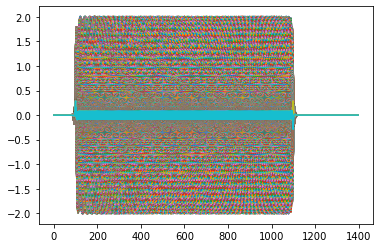

In [70]:
Y = np.zeros((freq_quantization, N+399))

for i in np.arange(freq_quantization):
    Y[i] = sistema_desconhecido(X[i])
    plt.plot(Y[i])


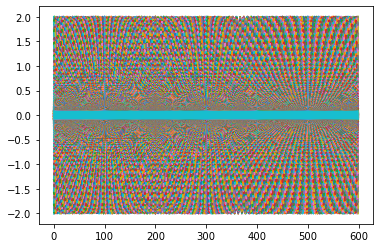

In [71]:
begin = 400
end   = 1000

y = np.zeros((freq_quantization,end-begin))
H = np.zeros(freq_quantization)

for i in np.arange(freq_quantization):
    y[i] = Y[i][begin:end]
    H[i] = np.amax(y[i])
    plt.plot(y[i])

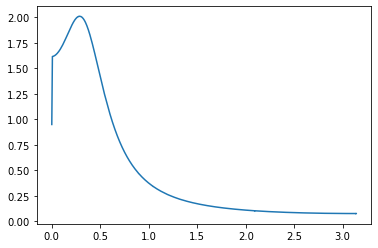

In [75]:
w = np.arange(freq_quantization)*np.pi/1000

plt.plot(w,H)

NameError: name 'freq_quantization' is not defined

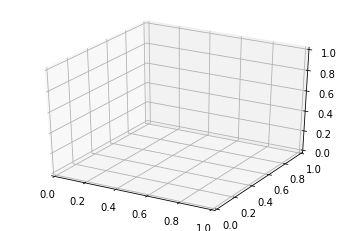

In [3]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for z in np.arange(freq_quantization):
    xs = np.arange(N+399)
    ys = Y[z]
    # You can provide either a single color or an array. To demonstrate this,
    # the first bar of each set will be colored cyan.
    ax.bar(xs, ys, zs=z*10, zdir='y', alpha=0.8)
    
    
ax.set_xlabel('Time [n]')
ax.set_ylabel('Frequency [rad]')
ax.set_zlabel('Amplitude')

plt.show()


In [40]:
import pandas as pd

df = pd.DataFrame(dict(
    X=[0,1,2,3, 0,1,2,3], 
    Y=[0,0,0,0, 1,1,1,1], 
    Z=[0,1,2,3, 0,1,2,3],
    color=["a", "a", "a", "a", "b", "b", "b", "b"]
))

df = pd.DataFrame(dict(
    X=[0,1,2,3, 0,1,2,3], 
    Y=[0,0,0,0, 1,1,1,1], 
    Z=[0,1,2,3, 0,1,2,3],
    color=["a", "a", "a", "a", "b", "b", "b", "b"]
))

import plotly.express as px

fig = px.line_3d(df, x='X', y='Y', z='Z')
fig.show()

In [42]:
df=pd.DataFrame(X) 
print(df)

import plotly.express as px

fig = px.line_3d(df, x=0, y=1, z=0)
fig.show()



          0         1         2         3         4         5         6    \
0    1.000000  1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
1    0.540302  0.540302  0.540302  0.540302  0.540302  0.540302  0.540302   
2   -0.416147 -0.416147 -0.416147 -0.416147 -0.416147 -0.416147 -0.416147   
3   -0.989992 -0.989992 -0.989992 -0.989992 -0.989992 -0.989992 -0.989992   
4   -0.653644 -0.653644 -0.653644 -0.653644 -0.653644 -0.653644 -0.653644   
..        ...       ...       ...       ...       ...       ...       ...   
995 -0.633389 -0.633389 -0.633389 -0.633389 -0.633389 -0.633389 -0.633389   
996 -0.993380 -0.993380 -0.993380 -0.993380 -0.993380 -0.993380 -0.993380   
997 -0.440062 -0.440062 -0.440062 -0.440062 -0.440062 -0.440062 -0.440062   
998  0.517847  0.517847  0.517847  0.517847  0.517847  0.517847  0.517847   
999  0.999650  0.999650  0.999650  0.999650  0.999650  0.999650  0.999650   

          7         8         9    ...       990       991       992  \
0  

In [106]:
################
# Input generator

# User inputs

# Divide [0,pi] by freq_disc intervals
freq_disc = 100

# Cosine input extension per frequency
cos_size = 1000

def one_period_cos(freq):
    if(freq == 0):
        return 0
    return np.cos(freq*np.arange(2*np.pi/freq))

x = []

X = {}

X['input'] = []

frequencies = np.arange(0,np.pi,np.pi/freq_disc)

for i in frequencies:
        X['input'] = np.append(X['input'], np.cos(i*np.arange(cos_size)))

X['output'] = sistema_desconhecido(X['input'])       

X['input'] = np.append(X['input'], np.zeros(len(X['output'])-len(X['input'])))


#plt.plot(X['input'])
#plt.plot(X['output'])

df1=pd.DataFrame(X) 

fig = px.line(df1,y='input')
fig.show()

fig = px.line(df1,y='output')
fig.show()





